# SEGMENTASYON:

Hough dönüşümü-bir görüntüde daire ve çizgi algılama (scikit-image ile)

Eşikleme ve Otsu segmentasyonu (scikit-image ile)

Kenar tabanlı/bölge tabanlı segmentasyon teknikleri (scikit-image ile)

Felzenszwalb, SLIC, QuickShift ve Compact Watershed algoritmalar (scikit-image ile)

Aktif konturlar, morfolojik snakes ve GrabCut algoritmaları (scikitimage ve python-opencv)

# Görüntü bölütleme, 

Bir görüntünün farklı nesnelere veya nesnelerin parçalarına karşılık gelen farklı bölgelere veya kategorilere ayrılmasıdır. 

Her bölge benzer niteliklere sahip pikseller içerir ve görüntüdeki her piksel bu kategorilerden birine atanır. 
İyi bir segmentasyon tipik olarak aynı kategorideki piksellerin benzer yoğunluk değerlerine sahip olduğu ve 
bağlantılı bir bölge oluşturduğu, farklı kategorilerdeki komşu piksellerin ise benzer olmayan değerlere sahip olduğu 
bir segmentasyondur. 

Bunun amacı, bir görüntünün temsilini daha anlamlı ve analiz edilmesi daha kolay bir şekilde basitleştirmek/değiştirmektir.

Segmentasyon iyi yapılırsa, görüntü analizindeki diğer tüm aşamalar daha basit hale gelir.

Dolayısıyla, segmentasyonun kalitesi ve güvenilirliği bir görüntü analizinin başarılı olup olmayacağını belirler. Ancak bir görüntüyü doğru segmentlere ayırmak genellikle çok zorlu bir iştir

Bölütleme teknikleri bağlamsal olmayabilir (bir görüntüdeki özellikler arasındaki uzamsal ilişkileri dikkate almaz ve pikselleri yalnızca renk/gri seviyesi gibi bazı küresel niteliklere göre gruplandırır) veya bağlamsal olabilir (uzamsal ilişkilerden ek olarak yararlanır; örneğin, benzer gri seviyelerine sahip uzamsal olarak yakın pikselleri gruplandırır). Bu bölümde, scikit-image, python-opencv (cv2) ve SimpleITK kütüphane fonksiyonlarını kullanarak Python tabanlı uygulamalarını göstereceğiz. 

In [1]:
import numpy as np
from skimage.transform import (hough_line, hough_line_peaks, hough_circle, hough_circle_peaks)
from skimage.draw import circle_perimeter
from skimage.feature import canny
from skimage.data import astronaut
from skimage.io import imread, imsave
from skimage.color import rgb2gray, gray2rgb, label2rgb
from skimage import img_as_float,color
from skimage.morphology import skeletonize
from skimage import data, img_as_float
import matplotlib.pyplot as plt
from matplotlib import cm
from skimage.filters import sobel, threshold_otsu
from skimage.feature import canny
from skimage.segmentation import felzenszwalb, slic, quickshift, watershed
from skimage.segmentation import mark_boundaries, find_boundaries
import matplotlib.pyplot as pylab


C:\Users\MKOTAN\anaconda3\envs\ImageProcess\lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [ ]:
#Hough dönüşümü - çizgileri ve daireleri tespit etme

#Görüntü işlemede Hough dönüşümü, bir parametre uzayında gerçekleştirilen bir oylama prosedürü kullanarak 
#belirli bir şekle sahip nesnelerin örneklerini bulmayı amaçlayan bir özellik çıkarma tekniğidir. 
#En basit haliyle, klasik Hough dönüşümü bir görüntüdeki düz çizgileri tespit etmek için kullanılabilir. 
#Düz bir çizgiyi kutupsal parametreler (ρ, θ) kullanarak temsil edebiliriz; burada ρ çizgi parçasının uzunluğu 
#ve θ çizgi ile x ekseni arasındaki açıdır. (ρ, θ) parametre uzayını keşfetmek için önce bir 2D-histogram oluşturur. 

#Ardından, ρ ve θ'nın her değeri için, giriş görüntüsünde karşılık gelen çizgiye yakın olan sıfır olmayan piksellerin sayısını 
#hesaplar ve diziyi buna göre (ρ, θ) konumunda artırır. Dolayısıyla, sıfır olmayan her piksel potansiyel çizgi adayları için
#oylama olarak düşünülebilir. En olası çizgiler, en yüksek oyu alan parametre değerlerine, 
#yani 2D histogramdaki yerel maksimumlara karşılık gelir. 
#Bu yöntem daireleri (ve diğer eğrileri) tespit etmek için genişletilebilir. 

#Benzer bir oylama yöntemi, dairelerin parametre uzayında maksimum değerleri bulmak için de kullanılabilir. 
#Bir eğrinin ne kadar çok parametresi varsa, eğriyi tespit etmek için Hough dönüşümünü kullanmak uzamsal ve 
#hesaplama açısından o kadar pahalı olacaktır.

#Bir sonraki kod bloğu hough_line() veya hough_line_peaks() fonksiyonlarının nasıl kullanılacağını 
#ve ayrıca scikit-image transform modülünden hough_circle() veya hough_circle_peaks() fonksiyonlarının 
#sırasıyla çizgiler ve daireler içeren bir giriş görüntüsünden düz çizgileri/daireleri tespit etmek için 
#nasıl kullanılacağını göstermektedir:



C:\Users\MKOTAN\AppData\Local\Temp\ipykernel_22036\1390637100.py:29: RuntimeWarning: divide by zero encountered in scalar divide
  y0 = (dist - 0 * np.cos(angle)) / np.sin(angle)
C:\Users\MKOTAN\AppData\Local\Temp\ipykernel_22036\1390637100.py:30: RuntimeWarning: divide by zero encountered in scalar divide
  y1 = (dist - image.shape[1] * np.cos(angle)) / np.sin(angle)


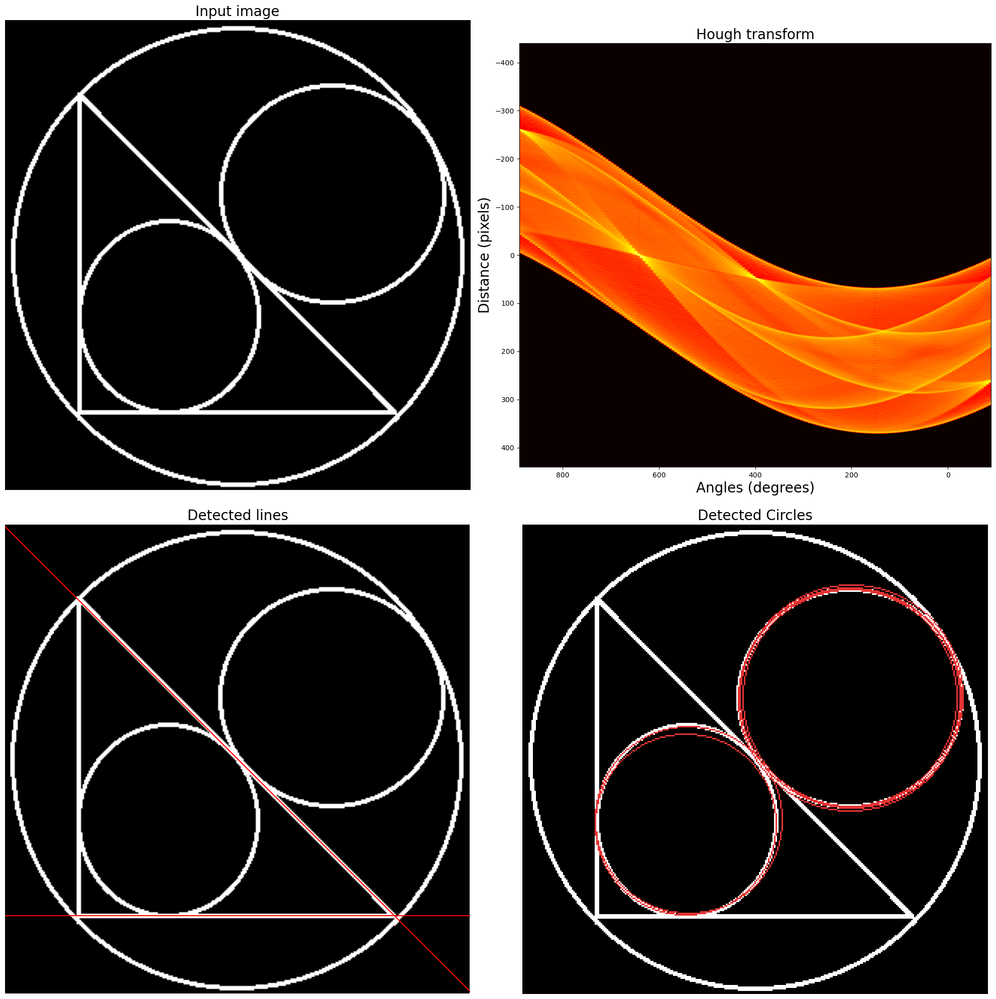

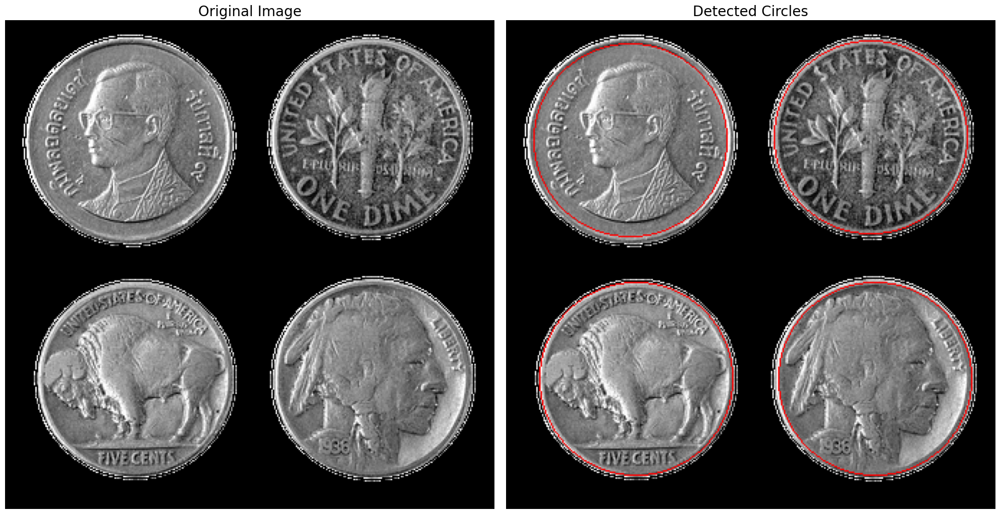

In [2]:
#https://scikit-image.org/docs/stable/auto_examples/edges/plot_line_hough_transform.html
#https://docs.opencv.org/3.4/d9/db0/tutorial_hough_lines.html
#https://docs.opencv.org/3.4/d4/d70/tutorial_hough_circle.html
#https://scikit-image.org/docs/stable/auto_examples/edges/plot_circular_elliptical_hough_transform.html

image = rgb2gray(imread('Ims/triangle_circle.png')[:,:,0:3])

# Classic straight-line Hough transform
h, theta, d = hough_line(image)


fig, axes = plt.subplots(2, 2, figsize=(20, 20))
ax = axes.ravel()

ax[0].imshow(image, cmap=cm.gray)
ax[0].set_title('Input image', size=20)
ax[0].set_axis_off()

ax[1].imshow(np.log(1 + h),
             extent=[10*np.rad2deg(theta[-1]), np.rad2deg(theta[0]), d[-1], d[0]],
             cmap=cm.hot, aspect=1/1.5)
ax[1].set_title('Hough transform', size=20)
ax[1].set_xlabel('Angles (degrees)', size=20)
ax[1].set_ylabel('Distance (pixels)', size=20)
ax[1].axis('image')

ax[2].imshow(image, cmap=cm.gray)
for _, angle, dist in zip(*hough_line_peaks(h, theta, d)):
    y0 = (dist - 0 * np.cos(angle)) / np.sin(angle)
    y1 = (dist - image.shape[1] * np.cos(angle)) / np.sin(angle)
    ax[2].plot((0, image.shape[1]), (y0, y1), '-r')
ax[2].set_xlim((0, image.shape[1]))
ax[2].set_ylim((image.shape[0], 0))
ax[2].set_axis_off()
ax[2].set_title('Detected lines', size=20)

hough_radii = np.arange(50, 100, 2)
hough_res = hough_circle(image, hough_radii)

# Select the most prominent 5 circles
accums, cx, cy, radii = hough_circle_peaks(hough_res, hough_radii, total_num_peaks=6)

image = gray2rgb(image)
for center_y, center_x, radius in zip(cy, cx, radii):
    circy, circx = circle_perimeter(center_y, center_x, radius)
    image[circy, circx] = (0.9, 0.2, 0.2)

ax[3].imshow(image, cmap=plt.cm.gray)
ax[3].set_axis_off()
ax[3].set_title('Detected Circles', size=20)

plt.tight_layout()
plt.show()

image = rgb2gray(imread('Ims/coins.png')[:,:,0:3])

fig, axes = plt.subplots(1, 2, figsize=(20, 10), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(image, cmap=plt.cm.gray)
ax[0].set_axis_off()
ax[0].set_title('Original Image', size=20)

hough_radii = np.arange(65, 75, 1)
hough_res = hough_circle(image, hough_radii)

# Select the most prominent 5 circles
accums, cx, cy, radii = hough_circle_peaks(hough_res, hough_radii, total_num_peaks=4)

image = gray2rgb(image)
for center_y, center_x, radius in zip(cy, cx, radii):
    circy, circx = circle_perimeter(center_y, center_x, radius)
    image[circy, circx] = (1, 0, 0)

ax[1].imshow(image, cmap=plt.cm.gray)
ax[1].set_axis_off()
ax[1].set_title('Detected Circles', size=20)

plt.tight_layout()
plt.show()

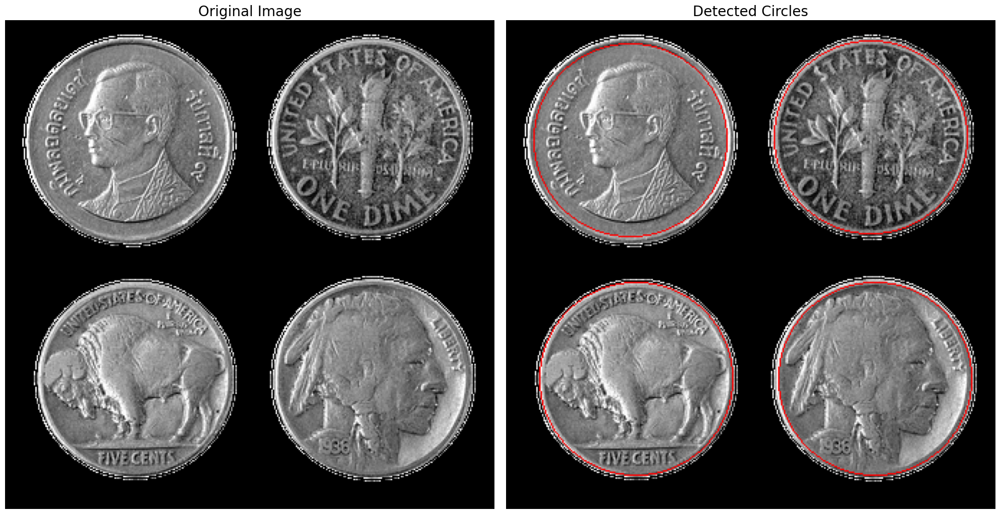

(None, None)

In [5]:
image = rgb2gray(imread('Ims/coins.png')[:,:,0:3])
fig, axes = pylab.subplots(1, 2, figsize=(20, 10), sharex=True,
sharey=True)
axes = axes.ravel()
axes[0].imshow(image, cmap=pylab.cm.gray), axes[0].set_axis_off()
axes[0].set_title('Original Image', size=20)
hough_radii = np.arange(65, 75, 1)
hough_res = hough_circle(image, hough_radii)
# En öne çıkan 4 çember
accums, c_x, c_y, radii = hough_circle_peaks(hough_res, hough_radii,
total_num_peaks=4)
image = color.gray2rgb(image)
for center_y, center_x, radius in zip(c_y, c_x, radii):
    circ_y, circ_x = circle_perimeter(center_y, center_x, radius)
    image[circ_y, circ_x] = (1, 0, 0)
axes[1].imshow(image, cmap=pylab.cm.gray), axes[1].set_axis_off()
axes[1].set_title('Detected Circles', size=20)
pylab.tight_layout(), pylab.show()

C:\Users\MKOTAN\AppData\Local\Temp\ipykernel_22036\871324606.py:28: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax[2] = plt.subplot(2, 2, 3, sharex=ax[0], sharey=ax[0])
C:\Users\MKOTAN\AppData\Local\Temp\ipykernel_22036\871324606.py:29: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax[3] = plt.subplot(2, 2, 4, sharex=ax[0], sharey=ax[0])


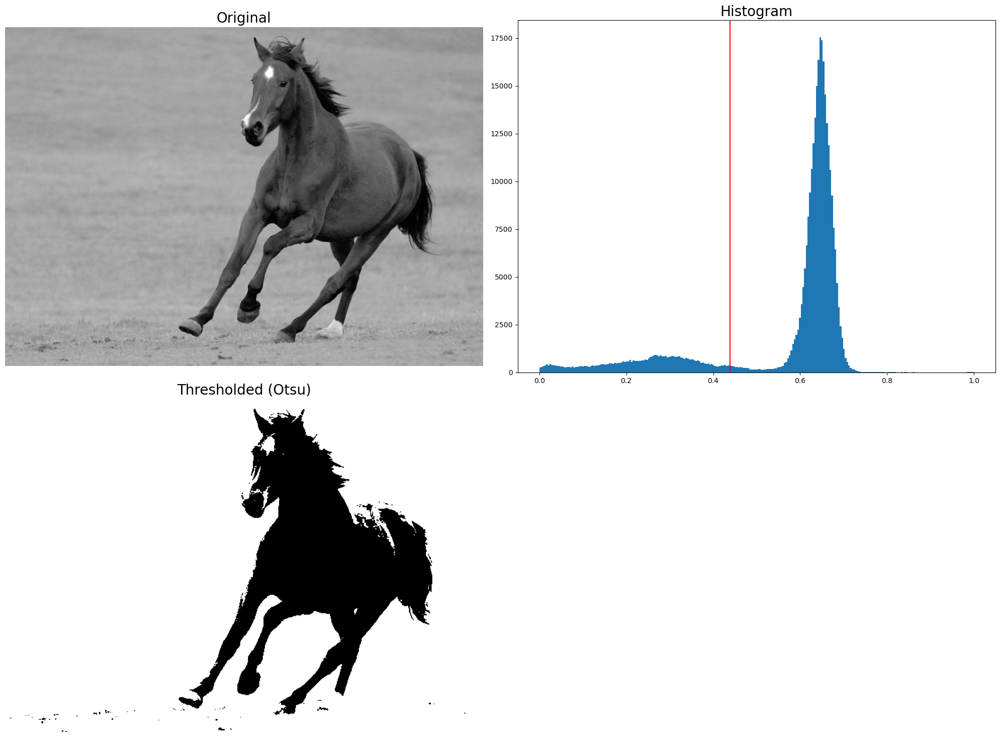

In [6]:
#Thresholding ve Otsu's segmentation

#Eşikleme, gri tonlamalı bir görüntüden ikili bir görüntü (yalnızca siyah-beyaz piksellere sahip bir görüntü) oluşturmak için 
#bir piksel değerini eşik olarak kullanan bir algoritma ailesini ifade eder. 
#Bir görüntüdeki nesneleri arka plandan ayırmanın en basit yolunu sağlar. 
#Eşik manuel olarak (piksel değerlerinin histogramına bakarak) veya algoritma kullanılarak otomatik olarak seçilebilir. 
#Scikit-image'da, histogram tabanlı (bir piksel yoğunluğu histogramı, bu histogramın özelliklerine ilişkin bazı varsayımlarla 
#birlikte kullanılır, örneğin bimodal) ve yerel (bir pikseli işlemek için yalnızca komşu pikseller kullanılır; 
#bu algoritmaları hesaplama açısından daha maliyetli hale getirir) olmak üzere iki kategoride eşikleme algoritması uygulaması 
#vardır.

#Bu bölümde sadece Otsu'nun yöntemi olarak bilinen popüler bir histogram tabanlı eşikleme yöntemini tartışacağız 
#(bimodal histogram varsayımıyla). 
#Bu yöntem, eş zamanlı olarak sınıflar arası varyansı en üst düzeye çıkararak ve iki piksel sınıfı 
#(bu eşik değeriyle ayrılan) arasındaki sınıf içi varyansı en aza indirerek optimum bir eşik değeri hesaplar. 
#Bir sonraki kod bloğu, Otsu ile ön planı arka plandan ayırmak için en uygun eşiği hesaplar

#Otsu'nun yöntemi ile hesaplanan optimum eşik, histogramda aşağıdaki gibi kırmızı bir çizgi ile işaretlenmiştir:

image =  rgb2gray(imread('Ims/horse.jpg')) #data.camera()
thresh = threshold_otsu(image)
binary = image > thresh

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 15))
ax = axes.ravel()
ax[0] = plt.subplot(2, 2, 1)
ax[1] = plt.subplot(2, 2, 2)
ax[2] = plt.subplot(2, 2, 3, sharex=ax[0], sharey=ax[0])
ax[3] = plt.subplot(2, 2, 4, sharex=ax[0], sharey=ax[0])

ax[0].imshow(image, cmap=plt.cm.gray)
ax[0].set_title('Original', size=20)
ax[0].axis('off')

ax[1].hist(image.ravel(), bins=256)
ax[1].set_title('Histogram', size=20)
ax[1].axvline(thresh, color='r')

ax[2].imshow(binary, cmap=plt.cm.gray)
ax[2].set_title('Thresholded (Otsu)', size=20)
ax[2].axis('off')

ax[3].axis('off')

plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'histogram of gray values')

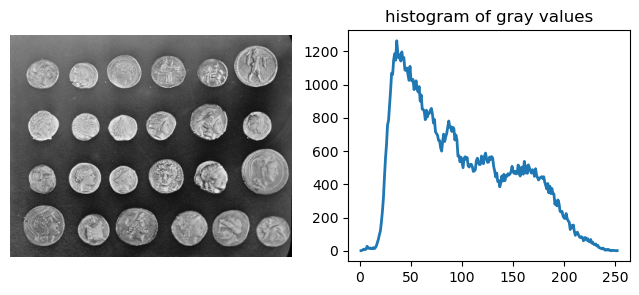

In [7]:
#Edges-based/region-based segmentation
#https://scikit-image.org/docs/stable/auto_examples/applications/plot_coins_segmentation.html

import numpy as np
import matplotlib.pyplot as plt

from skimage import data
from skimage.exposure import histogram

coins = data.coins()
hist, hist_centers = histogram(coins)

fig, axes = plt.subplots(1, 2, figsize=(8, 3))
axes[0].imshow(coins, cmap=plt.cm.gray)
axes[0].axis('off')
axes[1].plot(hist_centers, hist, lw=2)
axes[1].set_title('histogram of gray values')


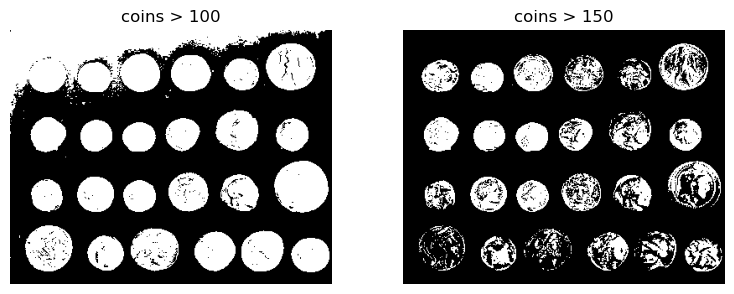

In [8]:
fig, axes = plt.subplots(1, 2, figsize=(8, 3), sharey=True)

axes[0].imshow(coins > 100, cmap=plt.cm.gray)
axes[0].set_title('coins > 100')

axes[1].imshow(coins > 150, cmap=plt.cm.gray)
axes[1].set_title('coins > 150')

for a in axes:
    a.axis('off')

plt.tight_layout()

(-0.5, 383.5, 302.5, -0.5)

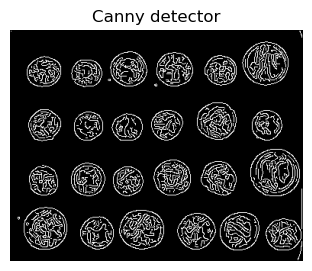

In [9]:
from skimage.feature import canny

edges = canny(coins)

fig, ax = plt.subplots(figsize=(4, 3))
ax.imshow(edges, cmap=plt.cm.gray)
ax.set_title('Canny detector')
ax.axis('off')

(-0.5, 383.5, 302.5, -0.5)

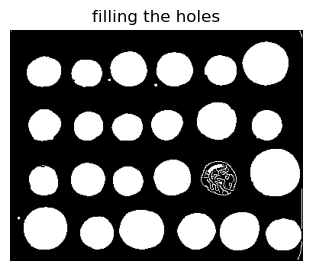

In [10]:
from scipy import ndimage as ndi

fill_coins = ndi.binary_fill_holes(edges)

fig, ax = plt.subplots(figsize=(4, 3))
ax.imshow(fill_coins, cmap=plt.cm.gray)
ax.set_title('filling the holes')
ax.axis('off')

(-0.5, 383.5, 302.5, -0.5)

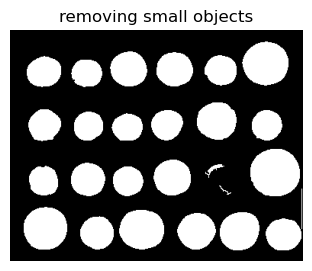

In [11]:
from skimage import morphology

coins_cleaned = morphology.remove_small_objects(fill_coins, 21)

fig, ax = plt.subplots(figsize=(4, 3))
ax.imshow(coins_cleaned, cmap=plt.cm.gray)
ax.set_title('removing small objects')
ax.axis('off')

(-0.5, 383.5, 302.5, -0.5)

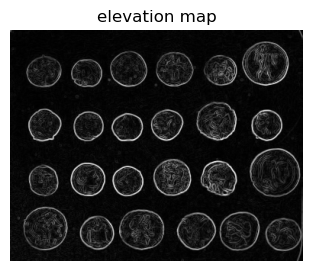

In [12]:
#Morphological watershed algorithm



from skimage.filters import sobel

elevation_map = sobel(coins)

fig, ax = plt.subplots(figsize=(4, 3))
ax.imshow(elevation_map, cmap=plt.cm.gray)
ax.set_title('elevation map')
ax.axis('off')

(-0.5, 383.5, 302.5, -0.5)

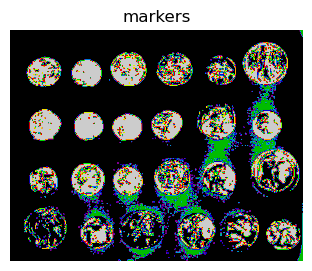

In [13]:
markers = np.zeros_like(coins)
markers[coins < 30] = 1
markers[coins > 150] = 2

fig, ax = plt.subplots(figsize=(4, 3))
ax.imshow(markers, cmap=plt.cm.nipy_spectral)
ax.set_title('markers')
ax.axis('off')

(-0.5, 383.5, 302.5, -0.5)

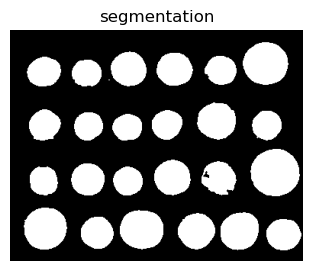

In [14]:
from skimage import segmentation

segmentation_coins = segmentation.watershed(elevation_map, markers)

fig, ax = plt.subplots(figsize=(4, 3))
ax.imshow(segmentation_coins, cmap=plt.cm.gray)
ax.set_title('segmentation')
ax.axis('off')

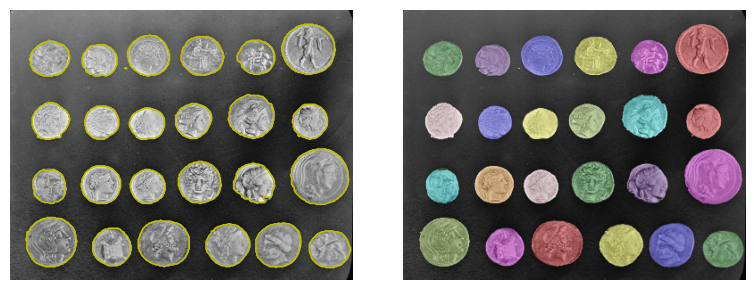

In [15]:
from skimage.color import label2rgb

segmentation_coins = ndi.binary_fill_holes(segmentation_coins - 1)
labeled_coins, _ = ndi.label(segmentation_coins)
image_label_overlay = label2rgb(labeled_coins, image=coins, bg_label=0)

fig, axes = plt.subplots(1, 2, figsize=(8, 3), sharey=True)
axes[0].imshow(coins, cmap=plt.cm.gray)
axes[0].contour(segmentation_coins, [0.5], linewidths=1.2, colors='y')
axes[1].imshow(image_label_overlay)

for a in axes:
    a.axis('off')

plt.tight_layout()

plt.show()

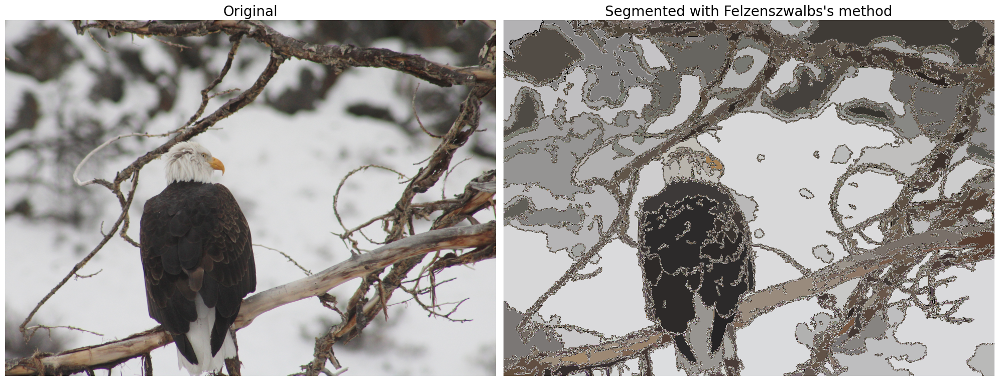

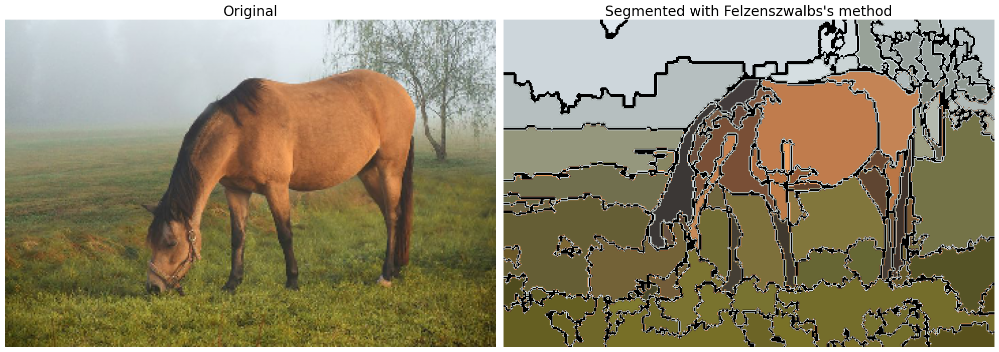

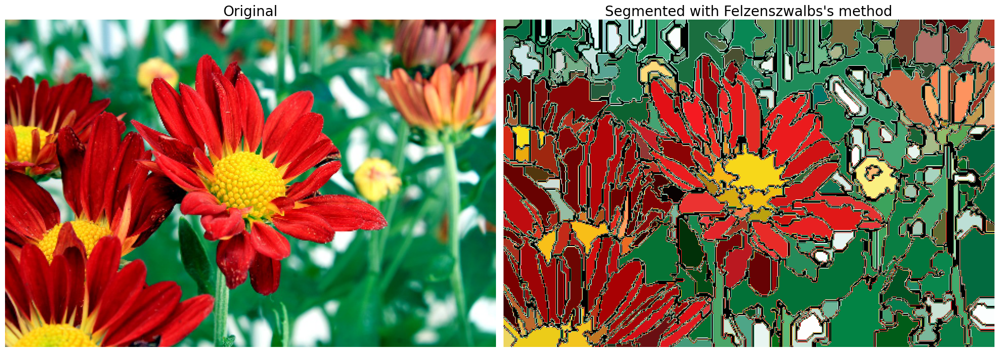

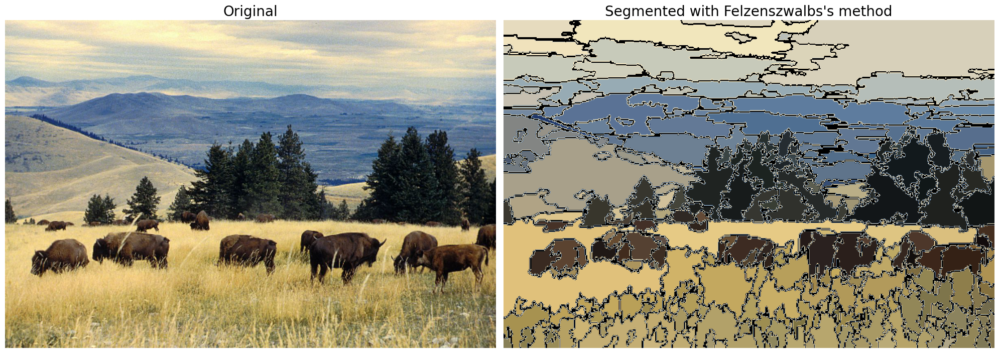

In [16]:
#Felzenszwalb, SLIC, QuickShift, Compact Watershed 

#İyi bölütlemenin tanımı genellikle uygulamaya bağlıdır ve bu nedenle iyi bir bölütleme elde etmek zordur.
#Bu yöntemler genellikle süperpiksel olarak da bilinen aşırı segmentasyon elde etmek için kullanılır. 
#Bu süper pikseller daha sonra bölge bitişiklik grafiği veya koşullu rastgele alanlarla birleştirme gibi daha karmaşık algoritmalar için bir temel görevi görür.

#Felzenszwalb's efficient graph-based image segmentation

#Felzenszwalb'ın algoritması segmentasyon için grafik tabanlı bir yaklaşım benimser. 

#İlk olarak, görüntü pikselleri köşeler (segmente edilecek küme) ve iki köşe arasındaki bir kenarın ağırlığı, 
#farklılığın bir ölçüsü (örneğin, yoğunluk farkı) olan yönlendirilmemiş bir grafik oluşturur. 

#Grafik tabanlı yaklaşımda, bir görüntüyü segmentlere ayırma problemi, oluşturulan grafikte bağlantılı bileşenleri 
#bulmaya dönüşür. Aynı bileşendeki iki köşe arasındaki kenarlar nispeten düşük ağırlığa sahip olmalı 
#ve farklı bileşenlerdeki köşeler arasındaki kenarlar daha yüksek ağırlığa sahip olmalıdır.

#Algoritma, grafik kenarlarının sayısında neredeyse doğrusal bir sürede çalışır ve pratikte de hızlıdır. 
#Bu teknik, düşük değişkenlikli görüntü bölgelerindeki ayrıntıları korurken, yüksek değişkenlikli bölgelerdeki ayrıntıları 
#göz ardı eder. Algoritma, segmentlerin boyutunu etkileyen tek ölçekli bir parametreye sahiptir. 
#Segmentlerin gerçek boyutu ve sayısı, yerel kontrasta bağlı olarak büyük ölçüde değişebilir.

from skimage.data import astronaut
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.filters import sobel
from skimage.segmentation import felzenszwalb, slic, quickshift, watershed
from skimage.segmentation import mark_boundaries, find_boundaries
from skimage.util import img_as_float

from matplotlib.colors import LinearSegmentedColormap
for imfile in ['Ims/eagle.jpg', 'Ims/horses.jpg', 'Ims/flowers.jpg', 'Ims/bisons.jpg']:
    img = img_as_float(imread(imfile)[::2, ::2, :3])
    plt.figure(figsize=(20,10))
    segments_fz = felzenszwalb(img, scale=100, sigma=0.5, min_size=100) #300
    borders = find_boundaries(segments_fz)
    unique_colors = np.unique(segments_fz.ravel())
    segments_fz[borders] = -1 #len(unique_colors)
    colors = [np.zeros(3)]
    for color in unique_colors:
        colors.append(np.mean(img[segments_fz == color], axis=0))    
    cm = LinearSegmentedColormap.from_list('pallete', colors, N=len(colors))
    plt.subplot(121)
    plt.imshow(img)
    plt.title('Original', size=20)
    plt.axis('off') 
    plt.subplot(122)
    plt.imshow(segments_fz, cmap=cm)
    plt.title('Segmented with Felzenszwalbs\'s method', size=20)
    plt.axis('off')   
    plt.tight_layout()
    plt.show()


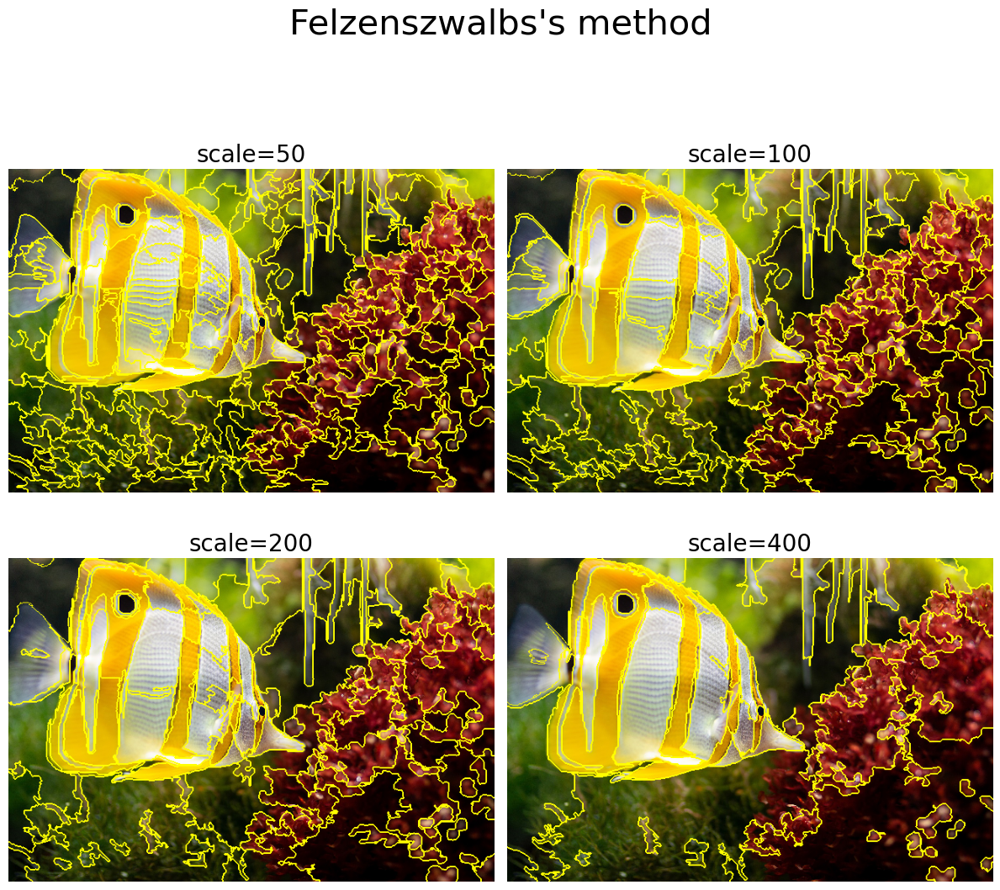

In [18]:
#ölçek (scale) parametresinin değeri arttıkça çıktı görüntüsündeki segment sayısı azalmaktadır:

def plot_image(img, title):
    plt.imshow(img)
    plt.title(title, size=20)
    plt.axis('off')    
    
img = imread('Ims/fish.jpg')[::2, ::2, :3] #img_as_float(astronaut()[::2, ::2])

plt.figure(figsize=(12,12))
i = 1
for scale in [50, 100, 200, 400]:
    plt.subplot(2,2,i)
    segments_fz = felzenszwalb(img, scale=scale, sigma=0.5, min_size=200)
    plot_image(mark_boundaries(img, segments_fz), 'scale=' + str(scale))
    i += 1
plt.suptitle('Felzenszwalbs\'s method', size=30)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

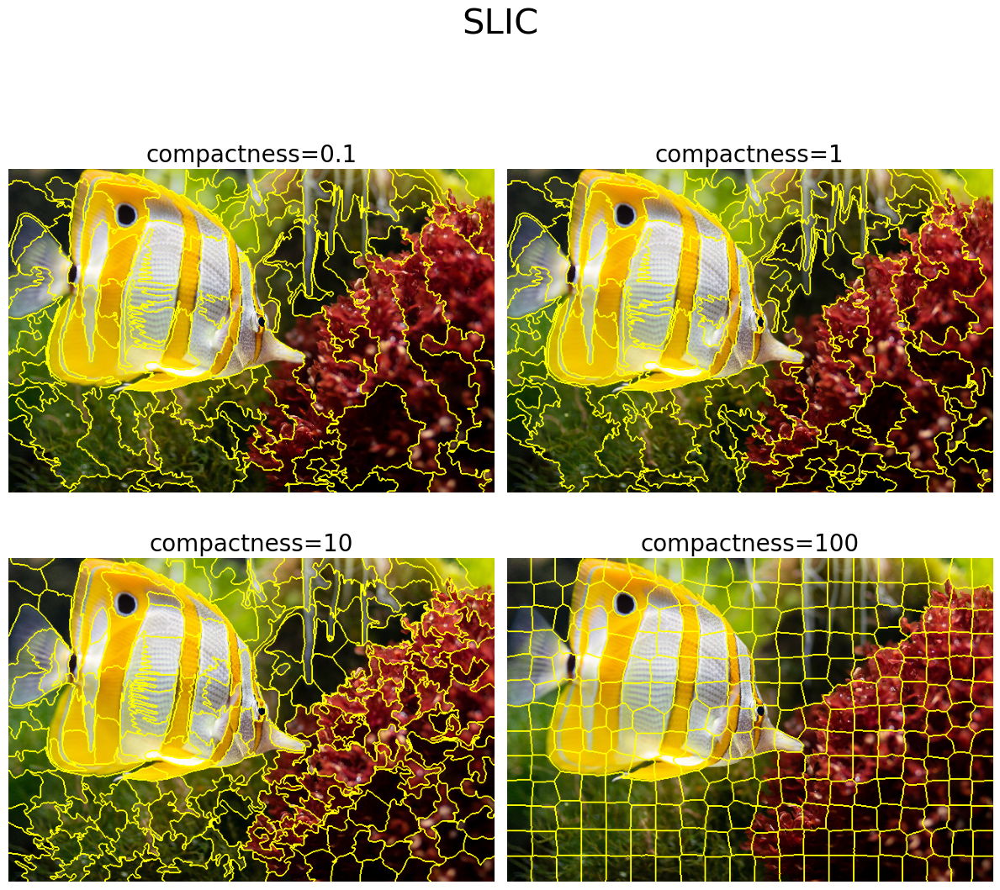

In [19]:
#SLIC

# SLIC algoritması beş boyutlu renk uzayı (RGB veya Lab) ve görüntü konumu (piksel koordinatları: x, y) uzayında 
#k-means kümelemesi gerçekleştirir. Kümeleme yöntemi daha basit olduğu için bu algoritma verimlidir. 
#İyi sonuçlar elde etmek için Lab renk uzayında çalışmak esastır. 
#Yaygın olarak kullanılmaktadır. 
#Kompaktlık parametresi renk benzerliği ve yakınlık arasında bir denge kurarken, 
#n_segments parametresi k-ortalamalar için merkez sayısını seçer. 


plt.figure(figsize=(12,12))
i = 1
for compactness in [0.1, 1, 10, 100]:
    plt.subplot(2,2,i)
    segments_slic = slic(img, n_segments=250, compactness=compactness, sigma=1)
    plot_image(mark_boundaries(img, segments_slic), 'compactness=' + str(compactness))
    i += 1
plt.suptitle('SLIC', size=30)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

#daha yüksek değerler alan yakınlığına daha fazla ağırlık vererek süper piksel şekillerini daha kare/kübik hale getirmektedir:

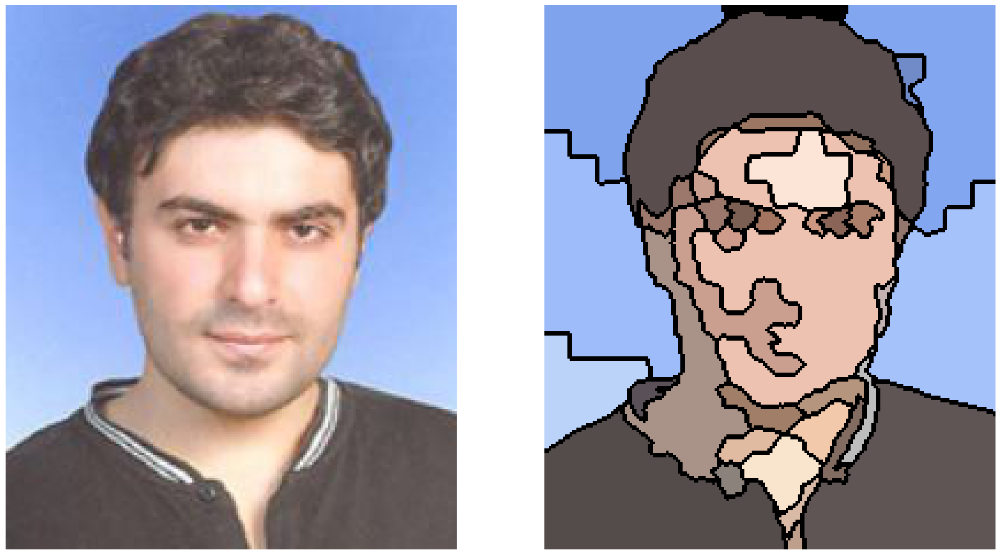

(None, None)

In [20]:
#RAG merging
#Region Adjacency Graph (RAG) bir görüntünün aşırı segmente edilmiş bölgelerini birleştirerek daha iyi bir segmentasyon 
#elde etmek için kullanılabilir

#İlk olarak giriş görüntüsünü bölütlemek ve bölge etiketlerini elde etmek için SLIC algoritmasını kullanır. 
#Ardından, bir RAG oluşturur ve renk bakımından benzer olan aşırı bölümlenmiş bölgeleri aşamalı olarak birleştirir. 
#İki bitişik bölgenin birleştirilmesi, birleştirilen bölgelerdeki tüm pikselleri içeren yeni bir bölge üretir. 
#Bölgeler, çok benzer bölge çifti kalmayana kadar birleştirilir:

from skimage import segmentation
from skimage.future import graph
def _weight_mean_color(graph, src, dst, n):
    diff = graph.nodes[dst]['mean color'] - graph.nodes[n]['mean color']
    diff = np.linalg.norm(diff)
    return {'weight': diff}

def merge_mean_color(graph, src, dst):
    graph.nodes[dst]['total color'] += graph.nodes[src]['total color']
    graph.nodes[dst]['pixel count'] += graph.nodes[src]['pixel count']
    graph.nodes[dst]['mean color'] = (graph.nodes[dst]['total color'] /
    graph.nodes[dst]['pixel count'])
img = imread('Ims/mk.jpg')
labels = segmentation.slic(img, compactness=30, n_segments=400)
g = graph.rag_mean_color(img, labels)
labels2 = graph.merge_hierarchical(labels, g, thresh=35, rag_copy=False,
in_place_merge=True,
merge_func=merge_mean_color,
weight_func=_weight_mean_color)
out = label2rgb(labels2, img, kind='avg')
out = segmentation.mark_boundaries(out, labels2, (0, 0, 0))
pylab.figure(figsize=(20,10))
pylab.subplot(121), pylab.imshow(img), pylab.axis('off')
pylab.subplot(122), pylab.imshow(out), pylab.axis('off')
pylab.tight_layout(), pylab.show()


In [ ]:
#Alıştırma sorusu: Aşağıdaki linkleri inceleyiniz. SAM modelini tartışınız
#https://blog.roboflow.com/semantic-segmentation-roboflow/
#https://roboflow.com/model-task-type/instance-segmentation